In [1]:
import pandas as pd
import numpy as np
import random

import matplotlib.pyplot as plt
from utils.plotting import plot_trajectory
from utils.processing import (
    open_file,
    cut_jumps,
    open_preprocessed_data,
)

In [2]:
import pickle
with open('angOrigDistr.pkl', 'rb') as fp:
    angleDistr = pickle.load(fp)

In [12]:
#making data-based power-law distributions for zones 0(center), Corners, Walls 

pl0_x = np.linspace(2,25,100)
pl0_y = 59.6 * (pl0_x ** (-0.9396))
# plt.figure()
# plt.plot(pl0_x, pl0_y)
# plt.show()

plC_x = np.linspace(2,25,100)
plC_y = 480.3 * (plC_x ** (-1.805))
# plt.figure()
# plt.plot(plC_x, plC_y)

plW_x = np.linspace(2,25,100)
plW_y = 272.99 * (plW_x ** (-1.189))
# plt.figure()
# plt.plot(plW_x, plW_y)



In [ ]:
pl_x = np.linspace(2,25,100)
pl_y = 141.7 * (pl_x ** (-1.32))

n = 600
mmpl = random.choices(pl_x, weights = pl_y, k = n)
mm0 = random.choices(pl0_x, weights = pl0_y, k = n)
mmC = random.choices(plC_x, weights = plC_y, k = n)
mmW = random.choices(plW_x, weights = plW_y, k = n)

plt.figure()
plt.hist(mmC, bins=50)
plt.title('power-law corners random output')
plt.show()


plt.figure()
plt.hist(mmW, bins=50)
plt.title('power-law walls random output')
plt.show()


plt.figure()
plt.hist(mm0, bins=50)
plt.title('power-law 0 random output')
plt.show()

In [13]:
def makeTr(n):
    i = 0
    N = n
    x = 0
    y = 0
    near = 0
    ang = 0
    ang_trig = 360 + 90 - ang
    if ang_trig > 360:
        ang_trig -= 360
    x_all = [x]
    y_all = [y]
    near_all = [near]
    ang_all = [ang]
    angle_all = [ang]
    ang_trig_all = [ang_trig]

    #mmpl = random.choices(pl_x, weights = pl_y, k = n)
    mm0 = random.choices(pl0_x, weights = pl0_y, k = n)
    mmC = random.choices(plC_x, weights = plC_y, k = n)
    mmW = random.choices(plW_x, weights = plW_y, k = n)
    #plt.figure()
    #plt.hist(mmpl, bins=50)
    #plt.title('power-law random output')
    #plt.show()

    while i < N:
        print(i)
        x = x_all[i]
        y = y_all[i]
        near = near_all[i]
        #step = mmpl[i]
        angle = angle_all[i]
        angle_trig = ang_trig_all[i]
        if angle > 360:
            print('alarm')
        if near == 0:
            step = mm0[i]
        elif near >= 10:
            step = mmC[i]
        elif (near >= 1) and (near <= 4):
            step = mmW[i]
        #варики в разных зонах
        #варик в центре
        if near == 0:
            deltang = random.choices(angleDistr['0'][0], weights = angleDistr['0'][1], k = 1)[0]
            ang += deltang

        #варики у стены
        forW_ang = random.choices(angleDistr['wall'][0], weights = angleDistr['0'][1], k = 1)[0]
        #варик слева справа    
        if (near == 2) or (near == 4):
            if (ang >= 0) and (ang <= 180):
                forSigm = -(4 / 90) * ang + 4
            elif (ang >= 180) and (ang <= 360):
                forSigm = (4 / 90) * ang - 12
            p0 = 1 / (1 + math.e ** (-forSigm))
            p180 = 1 - p0
            or0or180 = random.choices([0, 180], weights = [p0, p180], k = 1)
            or0or180 = or0or180[0]
            print(p0)
            print(or0or180)
            if or0or180 == 180:
                if (ang >= 0) and (ang <= 180):
                    angg = ang
                    deltang = 0.25 * (180 - angg)
                elif (ang >= 180) and (ang <= 360):
                    angg = 360 - ang
                    #эм а нафига мы так меняем углы...
                    deltang = - 0.25 * (180 - angg)
            if or0or180 == 0:
                if (ang >= 0) and (ang <= 180):
                    angg = ang
                    deltang = - 0.25 *  angg
                elif (ang >= 180) and (ang <= 360):
                    angg = ang - 360
                    deltang = - 0.25 * angg
            deltang += forW_ang * 0.02
            ang += deltang
            if ang >= 360:
                ang -= 360
        #варик снизу сверху    
        if (near == 1) or (near == 3):
            if (ang >= 0) and (ang <= 90):
                forSigm = (4 / 90) * ang
            elif (ang >= 90) and (ang <= 270):
                forSigm = - (4 / 90) * ang + 8
            elif (ang >= 270) and (ang <= 360):
                forSigm = (4 / 90) * ang - 16
            p90 = 1 / (1 + np.e ** (-forSigm))
            p270 = 1 - p90
            or90or270 = random.choices([90, 270], weights = [p90, p270], k = 1)
            or90or270= or90or270[0]
            print(p90)
            print(or90or270)
            #лучше переведем значения от 270 до 360 в от -90 до 0.
            if (ang > 270) and (ang <= 360):
                ang -= 360   
            if or90or270 == 90:
                if (ang >= -90) and (ang <= 90):
                    angg = ang
                    deltang = 0.25 * (90 - angg)
                elif (ang >= 90) and (ang <= 270):
                    angg = ang
                    deltang = 0.25 * (90 - angg)
            if or90or270 == 270:
                if (ang >= -90) and (ang <= 90):
                    angg = ang
                    deltang = 0.25 *  (-90 - angg)
                elif (ang >= 90) and (ang <= 270):
                    angg = ang
                    deltang = 0.25 * (270 - angg)
            deltang += forW_ang * 0.02
            ang += deltang
            if ang >= 360:
                ang -= 360
            if ang < 0:
                ang += 360


        #варик в углах
        elif (near >= 10) and (near <= 40):
            deltang = random.choices(angleDistr['corn'][0], weights = angleDistr['corn'][1], k = 1)[0]
            ang += deltang
        else:
            print('error with near value')    

        if ang < 0:
            ang += 360
        if ang > 360:
            ang -= 360
        if ang > 360:
            print('too big value of ang')
            ang -= 360
            print(ang)

        ang_trig = 360 + 90 - ang
        if ang_trig >= 360:
            ang_trig -= 360
        if ang_trig >= 360:
            ang_trig -= 360
        #вычислим x y из step и ang
        dx = step * np.cos(np.radians(ang_trig))
        dy = step * np.sin(np.radians(ang_trig))
        x += dx
        y += dy

        if x < -32:
            if y > 32:
                near = 40
            elif y < -32:
                near = 30
            else:
                near = 4
        elif x > 32:
            if y > 32:
                near = 10
            elif y < -32:
                near = 20
            else:
                near = 2
        elif y > 32:
            near = 1
        elif y < -32:
            near = 3
        elif (x > -32) and (y < 32) and (y > -32) and (x < 32):
            near = 0

        if (x >= -40) and (x <= 40) and (y >= -40) and (y <= 40):
            x_all.append(x)
            y_all.append(y)
            angle_all.append(ang)
            ang_trig_all.append(ang_trig)

            near_all.append(near)
            print('ok')
            i += 1
        else:
            print('mice run from the field')

    nn =len(x_all)
    time = np.linspace(0, nn * 0.5,nn)
    df = pd.DataFrame(list(zip(time,x_all, y_all, near_all)),columns =['time','x', 'y', 'near'])
    # traja.plot(df)
    
    return df


0
error with near value
ok
1
error with near value
ok
2
error with near value
ok
3
error with near value
ok
4
error with near value
ok
5
0.11920292202211794
0
error with near value
ok
6
0.406126897065858
180
error with near value
mice run from the field
6
0.2219048726326048
180
error with near value
mice run from the field
6
0.11718621899100722
180
error with near value
mice run from the field
6
0.07341942245842857
0
error with near value
mice run from the field
6
0.28514449593239644
0
error with near value
mice run from the field
6
0.5586011241094545
180
error with near value
mice run from the field
6
0.30674418179841345
0
error with near value
mice run from the field
6
0.6039763905308492
0
error with near value
mice run from the field
6
0.7936298814227426
0
error with near value
mice run from the field
6
0.8938048923394833
180
error with near value
mice run from the field
6
0.6513224130599675
0
error with near value
mice run from the field
6
0.8091725902888798
0
error with near value

mice run from the field
702
0.02135934510998952
270
mice run from the field
702
0.01912766914848412
270
mice run from the field
702
0.01862993761932746
270
mice run from the field
702
0.018847736434801192
270
mice run from the field
702
0.020953957777432863
270
mice run from the field
702
0.020138292484725394
270
mice run from the field
702
0.019363893842921254
270
mice run from the field
702
0.019708625914987905
270
ok
703
0.01848196645159147
270
ok
704
0.01850149978232469
270
ok
705
0.019017808350568936
270
ok
706
0.01854958887302639
270
ok
707
0.018378254567961806
270
ok
708
mice run from the field
708
ok
709
mice run from the field
709
mice run from the field
709
ok
710
0.9707425889405683
90
ok
711
0.9741195534627346
90
ok
712
0.9786481697334815
90
ok
713
0.9815274465948342
90
ok
714
0.9817364919327741
90
ok
715
0.9817776048362123
90
ok
716
0.9818083798926928
90
ok
717
0.9816593838588946
90
ok
718
0.9800406187013697
90
ok
719
ok
720
0.044362720363145175
270
ok
721
0.032898251320922

359
0.9806240316548199
90
mice run from the field
359
0.9814819317513221
90
mice run from the field
359
0.9818694943057527
90
mice run from the field
359
0.9818201956301358
90
mice run from the field
359
0.9806024935462189
90
mice run from the field
359
0.9812322090661427
90
mice run from the field
359
0.9806874798788312
90
mice run from the field
359
0.9817581247386672
90
mice run from the field
359
0.9810945553550382
90
mice run from the field
359
0.9805813975630775
90
mice run from the field
359
0.9791684621556006
90
mice run from the field
359
0.979116202611147
90
mice run from the field
359
0.9813346095793998
90
mice run from the field
359
0.9818234971574787
90
mice run from the field
359
0.9793497495931842
90
mice run from the field
359
0.9809372259832643
90
mice run from the field
359
0.98106410132677
90
mice run from the field
359
0.9798122247296657
90
mice run from the field
359
0.9805394355368616
90
mice run from the field
359
0.9814212730619668
90
mice run from the field
359

52
0.020884996688574443
180
error with near value
mice run from the field
52
0.020214895163862046
180
error with near value
mice run from the field
52
0.020037963912164777
180
error with near value
mice run from the field
52
0.0206047456781389
180
error with near value
mice run from the field
52
0.022895339327121633
180
error with near value
mice run from the field
52
0.024852138603490528
180
error with near value
mice run from the field
52
0.023471111256387647
180
error with near value
mice run from the field
52
0.022414548257754404
180
error with near value
mice run from the field
52
0.02091951055688386
180
error with near value
mice run from the field
52
0.022655230812971355
180
error with near value
mice run from the field
52
0.02115418184628433
180
error with near value
mice run from the field
52
0.02132535738005396
180
error with near value
mice run from the field
52
0.021387548426978317
180
error with near value
mice run from the field
52
0.02130047922752315
180
error with near 

766
0.018357526622472135
270
mice run from the field
766
0.018758150232155824
270
mice run from the field
766
0.019857952138144046
270
mice run from the field
766
0.020594539895266842
270
mice run from the field
766
0.022958524549602392
270
mice run from the field
766
0.02339568773784147
270
mice run from the field
766
0.020291611613025458
270
mice run from the field
766
0.01848360741884864
270
mice run from the field
766
0.020263961899698067
270
mice run from the field
766
0.01821316791015252
270
mice run from the field
766
0.020682297302124286
270
mice run from the field
766
0.019942004129249544
270
mice run from the field
766
0.019587388279354054
270
mice run from the field
766
0.01914438683217828
270
mice run from the field
766
0.018759601524006284
270
mice run from the field
766
0.019299911846429072
270
mice run from the field
766
0.020542063654932826
270
mice run from the field
766
0.01959303774158029
270
mice run from the field
766
0.01879122775677778
270
mice run from the field

181
0.021738663341064994
180
error with near value
mice run from the field
181
0.02044393244288706
180
error with near value
mice run from the field
181
0.019831362140198285
180
error with near value
mice run from the field
181
0.021767166462221366
180
error with near value
mice run from the field
181
0.02385519907296424
0
error with near value
mice run from the field
181
0.14924860282840494
180
error with near value
mice run from the field
181
0.08897783581556204
180
error with near value
mice run from the field
181
0.054421637422660825
180
error with near value
mice run from the field
181
0.043451912010028466
180
error with near value
mice run from the field
181
0.03608391112693717
180
error with near value
mice run from the field
181
0.031557804573918796
0
error with near value
mice run from the field
181
0.15271018414106086
180
error with near value
mice run from the field
181
0.09116225203630052
180
error with near value
mice run from the field
181
0.07134273293963922
180
error wi

0
error with near value
ok
1
error with near value
ok
2
error with near value
ok
3
error with near value
ok
4
error with near value
ok
5
error with near value
ok
6
error with near value
ok
7
error with near value
ok
8
error with near value
ok
9
error with near value
ok
10
error with near value
ok
11
error with near value
ok
12
error with near value
ok
13
0.9507339939159735
90
mice run from the field
13
0.9564950130056308
90
mice run from the field
13
0.9622903429462341
90
ok
14
0.9695264895262541
90
mice run from the field
14
0.9730633794838044
90
mice run from the field
14
0.9758310773481624
90
ok
15
0.9784768158492622
90
mice run from the field
15
0.9803349201990045
90
mice run from the field
15
0.9811569326690376
90
mice run from the field
15
0.9814623620252669
90
mice run from the field
15
0.9812811942693089
90
ok
16
ok
17
ok
18
0.034201101236305834
270
ok
19
0.025069277007639224
270
ok
20
0.02296968209174269
270
ok
21
0.024680374141166313
270
ok
22
0.02060164243039387
270
ok
23
0.

0
error with near value
ok
1
error with near value
ok
2
error with near value
ok
3
error with near value
ok
4
error with near value
ok
5
error with near value
ok
6
0.9608342772032354
0
error with near value
ok
7
ok
8
0.02974782476509828
180
error with near value
ok
9
0.029956342687694953
180
error with near value
ok
10
0.027262556488387518
180
error with near value
ok
11
0.02555711889055245
180
error with near value
ok
12
0.02005314188129105
180
error with near value
ok
13
0.01876470861421488
180
error with near value
ok
14
0.018064548226250542
180
error with near value
ok
15
ok
16
0.12005803938404287
270
mice run from the field
16
0.08248060846827643
270
mice run from the field
16
0.05687017679343299
270
ok
17
0.046180154841117246
270
mice run from the field
17
0.03825248282764966
270
mice run from the field
17
0.031577989252940544
270
mice run from the field
17
0.03152304831215055
270
mice run from the field
17
0.02737537617927731
270
mice run from the field
17
0.02876621176588169
27

0.14194709103521727
0
error with near value
mice run from the field
648
0.4500153860205284
0
error with near value
mice run from the field
648
0.702815990815
0
error with near value
mice run from the field
648
0.8490484979981527
0
error with near value
mice run from the field
648
0.9017629527676885
0
error with near value
mice run from the field
648
0.932511621867628
0
error with near value
mice run from the field
648
0.9497431467513124
0
error with near value
mice run from the field
648
0.9639413436942478
180
error with near value
mice run from the field
648
0.7911072557240718
0
error with near value
mice run from the field
648
0.8927083844483499
0
error with near value
mice run from the field
648
0.9308765155973372
0
error with near value
mice run from the field
648
0.9503472691614148
0
error with near value
mice run from the field
648
0.9622333501592499
0
error with near value
mice run from the field
648
0.9689186566665414
0
error with near value
mice run from the field
648
0.973415

0.979828375233751
90
mice run from the field
247
0.9796143029337121
90
mice run from the field
247
0.9797718402188736
90
mice run from the field
247
0.9798892101457062
90
mice run from the field
247
0.9786147637449462
90
mice run from the field
247
0.9760881315384577
90
mice run from the field
247
0.9773411101292002
90
mice run from the field
247
0.9807425615366681
90
mice run from the field
247
0.9778909136094083
90
mice run from the field
247
0.9781627125750159
90
mice run from the field
247
0.9794864511187097
270
mice run from the field
247
0.8685566798361001
270
ok
248
0.02731545488699736
180
error with near value
ok
249
0.02216870870658768
180
error with near value
ok
250
0.02257691827482617
180
error with near value
ok
251
0.01914480108425153
180
error with near value
ok
252
0.018878080674849106
180
error with near value
ok
253
0.01844076658058534
180
error with near value
ok
254
mice run from the field
254
mice run from the field
254
ok
255
0.019796286132411346
270
ok
256
0.0189

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



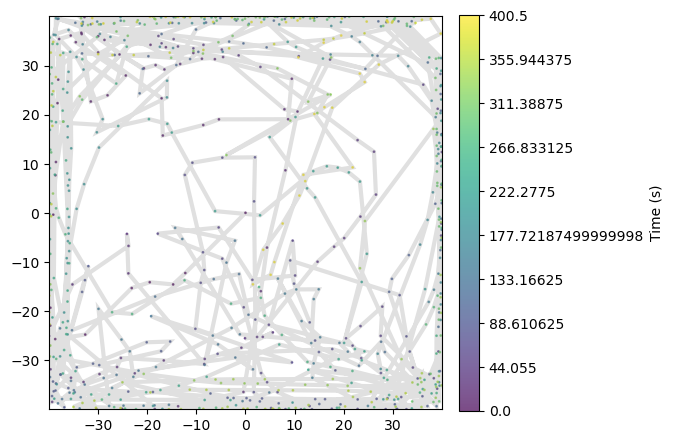

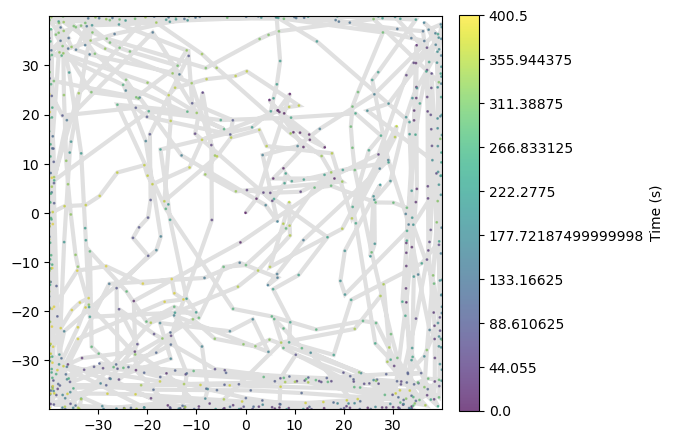

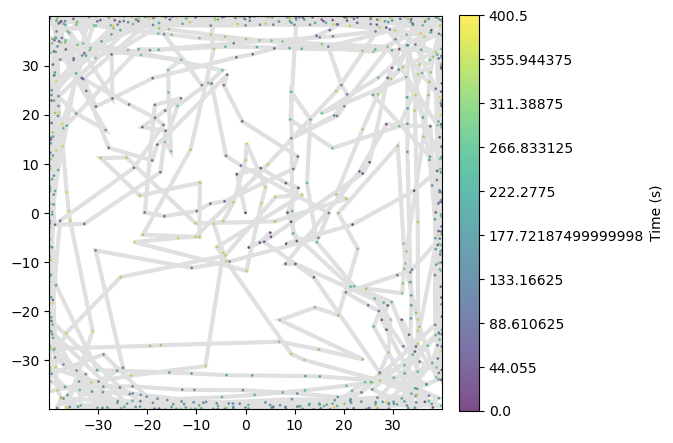

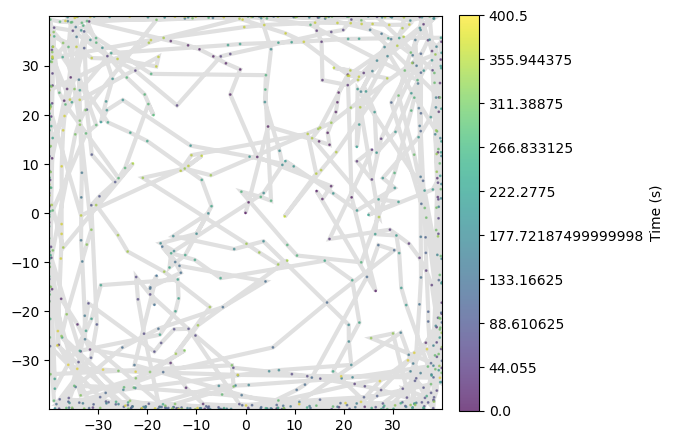

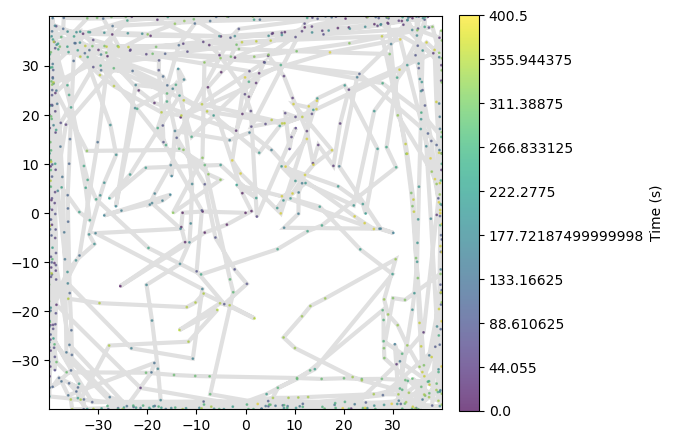

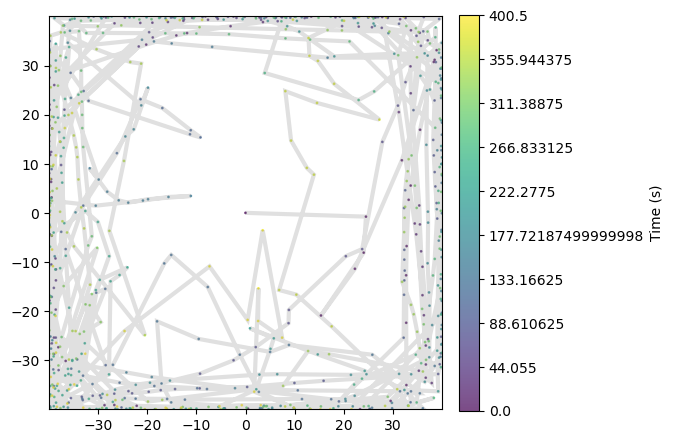

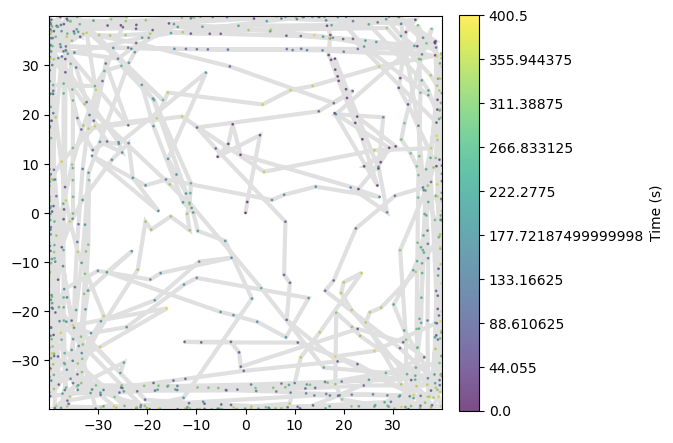

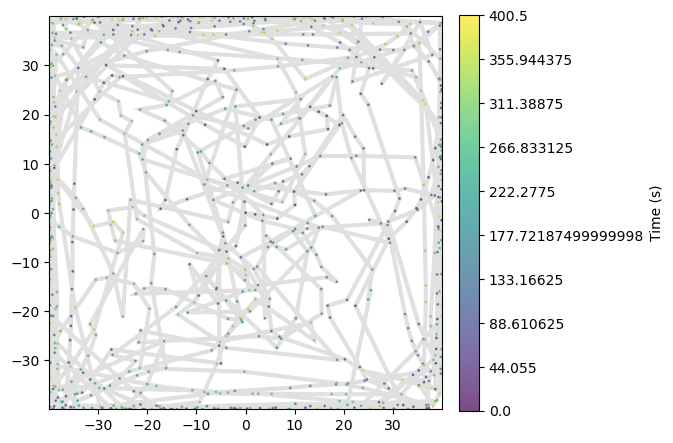

In [14]:
new_stepdfs = {}
for i in range(8):
    new_stepdfs[str(i)] = makeTr(800)

In [17]:
# for i in new_stepdfs:
#     new_stepdfs[i].to_csv('C:\\Users\\Lenovo\\1navigation\\stepdfs\\fund_mod1_'+i+'.csv', index=False)

In [17]:
new_stepdfs

{'0':            time          x          y  near
 0      0.000000   0.000000   0.000000     0
 1      0.500625 -12.256518 -12.256518     0
 2      1.001250 -14.730593 -14.579829     0
 3      1.501875 -19.497223 -14.129250     0
 4      2.002500 -23.166956 -15.321618     0
 ..          ...        ...        ...   ...
 796  398.497500  23.263579  28.358376     0
 797  398.998125  10.773016  31.658581     0
 798  399.498750  15.915027  34.651274     1
 799  399.999375  19.489868  36.103580     1
 800  400.500000  29.006798  38.827189     1
 
 [801 rows x 4 columns],
 '1':            time          x          y  near
 0      0.000000   0.000000   0.000000     0
 1      0.500625   2.222562   2.865310     0
 2      1.001250   7.866024  20.234099     0
 3      1.501875   9.007351  24.162573     0
 4      2.002500   6.602775  20.852958     0
 ..          ...        ...        ...   ...
 796  398.497500 -39.351169 -11.271653     4
 797  398.998125 -39.239697  -2.302648     4
 798  399.498750 -

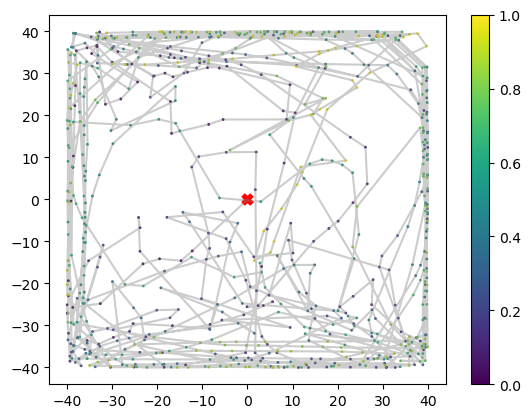

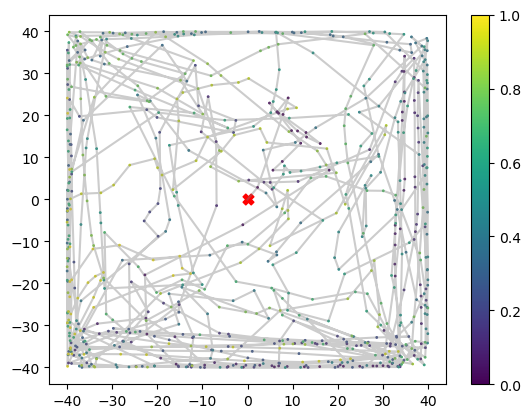

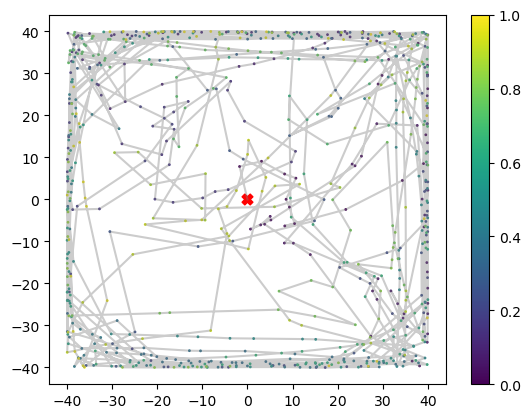

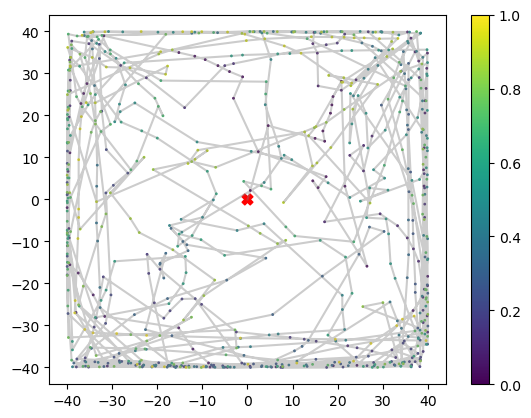

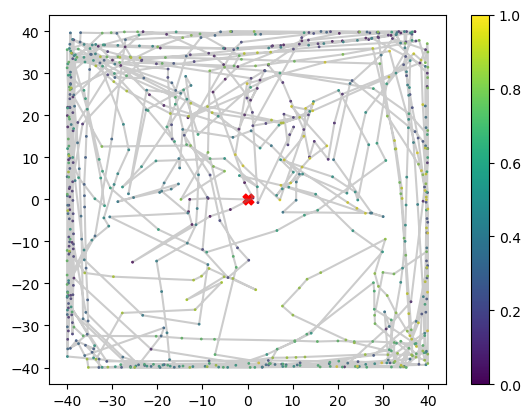

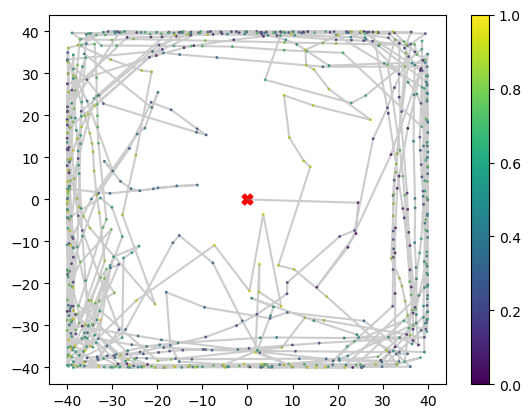

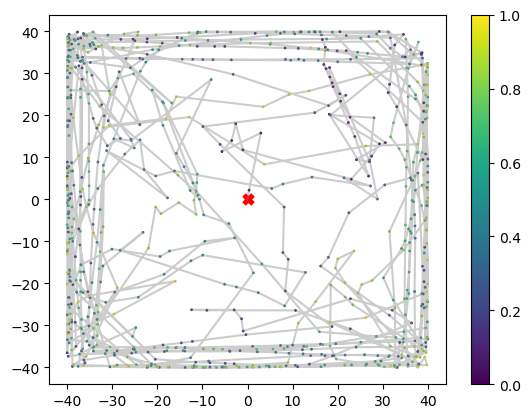

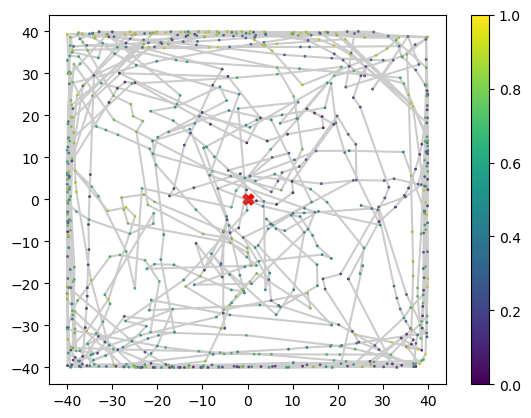

In [18]:
for k, df in new_stepdfs.items():
    plot_trajectory(df['x'], df['y'], xylim=None)

## это не нужно проверять

In [80]:
def returnStepsDFdeltaAng(df, dur):
    time_last = df['time'][0]
    ind_good = [0]
    for i in range(1, len(df)):
        if df['time'][i] - time_last >= dur:
            time_last = df['time'][i]
            ind_good.append(i)    
    df = df.iloc[ind_good]
    df = df.reset_index()
    df = df.drop(['index'], axis=1)
    #delAng = [0] * len(df) - лучше не делать так, а то мы не увидим ошибки типа нанов
    delAng = [0]
    for i in range(1,len(df)):
        d = df['angles'][i]-df['angles'][i-1]
        if d > 180:
            d = d - 360
        if d < -180:
            d = d + 360
        delAng.append(d)
    df['delta_angle'] = delAng
    return df

def returnSteps(df, dur):
    time_last = df['time'][0]
    ind_good = [0]
    for i in range(1, len(df)):
        if df['time'][i] - time_last >= dur:
            time_last = df['time'][i]
            ind_good.append(i)    
    df = df.iloc[ind_good]
    df = df.reset_index()
    df = df.drop(['index'], axis=1)
    return df

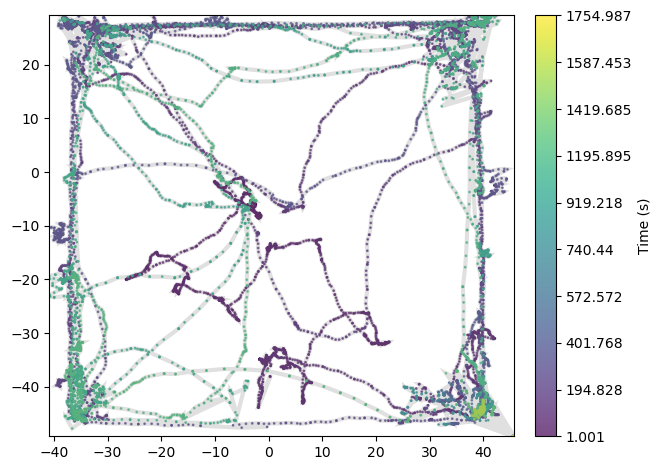

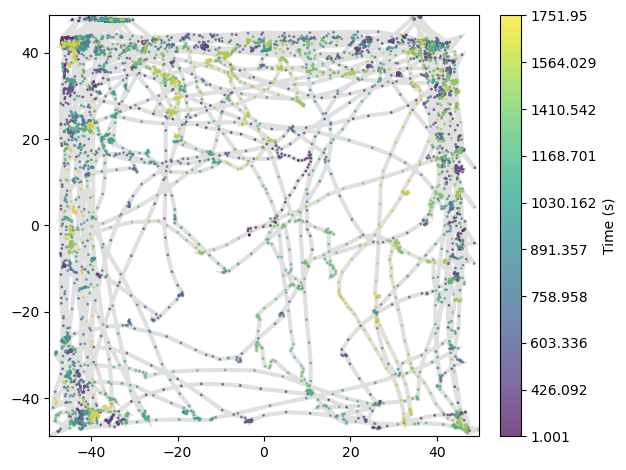

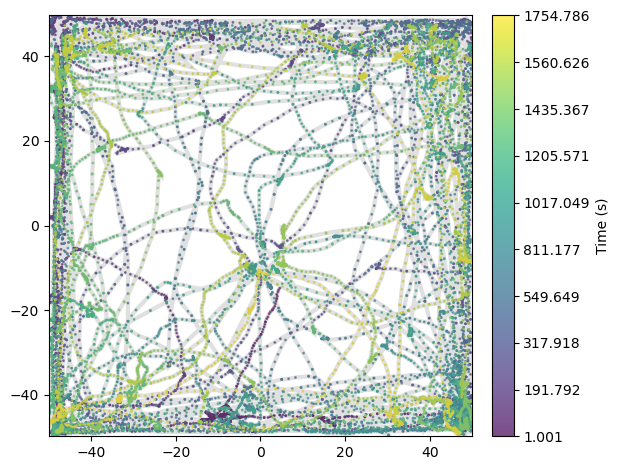

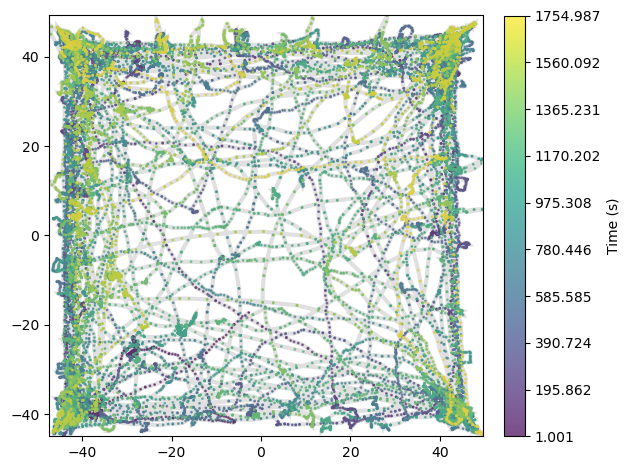

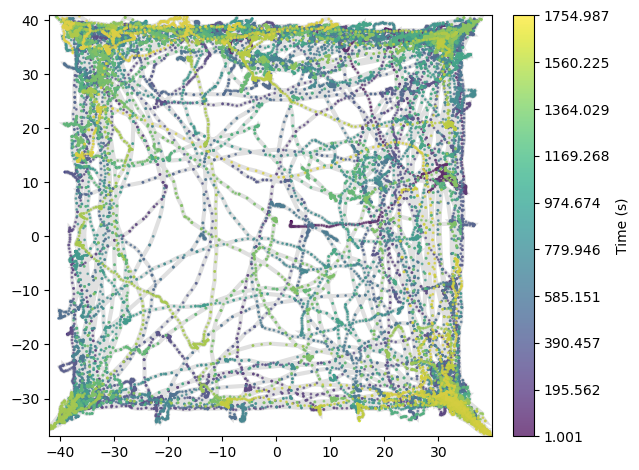

...

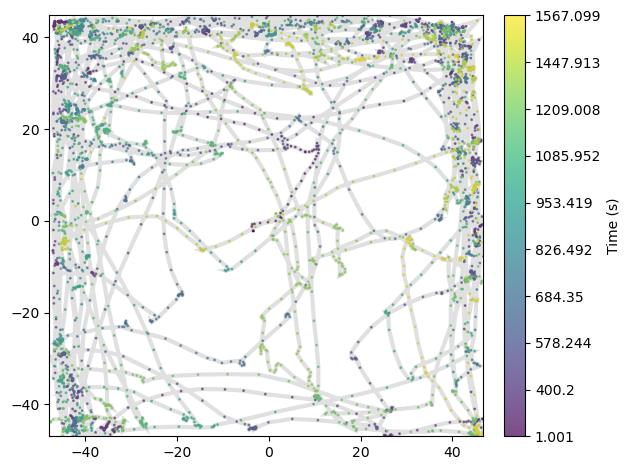

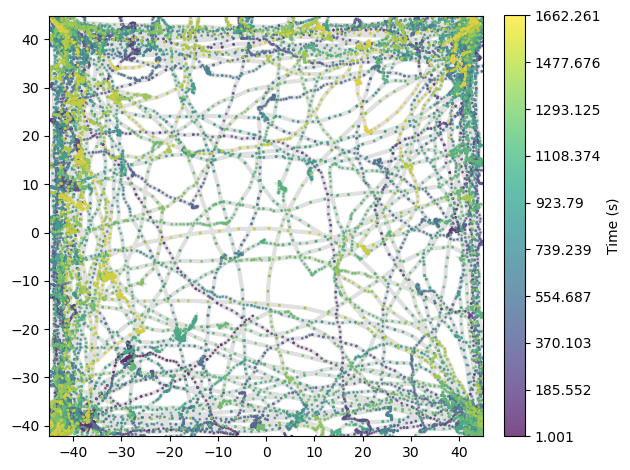

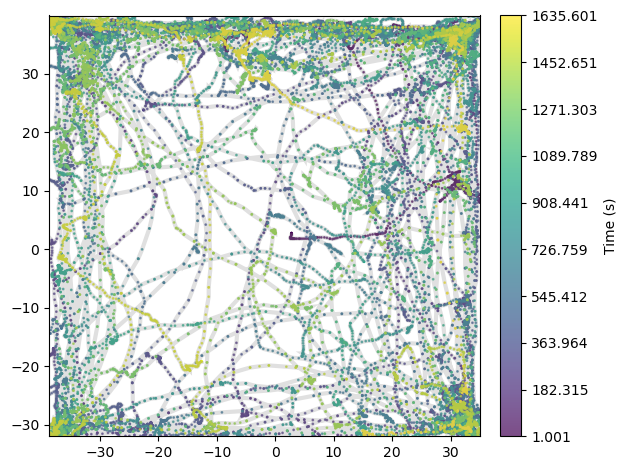

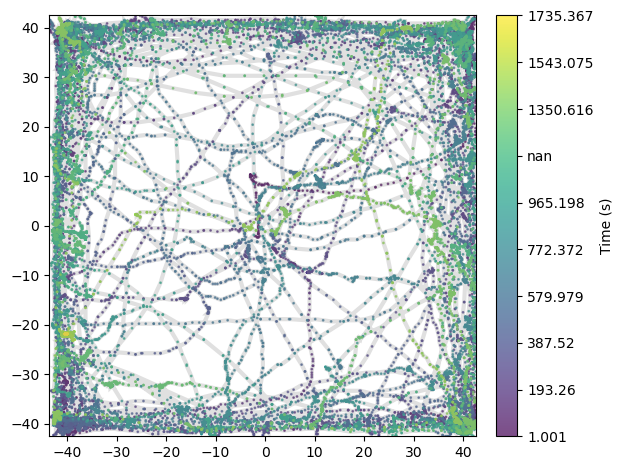

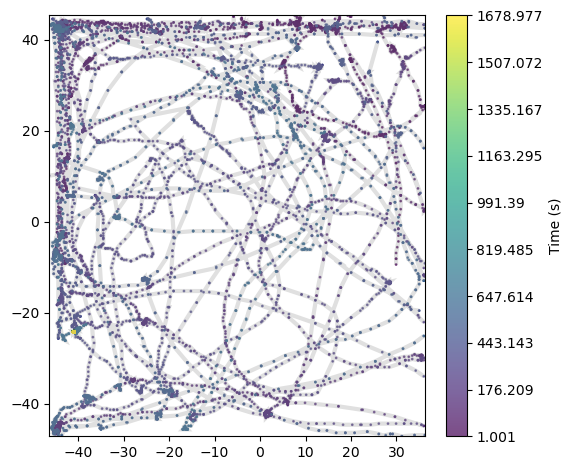

In [81]:
import traja
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from scipy import stats
from scipy.ndimage import gaussian_filter1d

import cv2

import math

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import pandas as pd

def openFile(ff):
    df = pd.read_csv(ff, sep=" ",header = None, names=['numb', 'time', 'x', 'y'])
    df = df.drop('numb', axis=1)
    df = df.drop(df[df.time > 1755].index)
    df = df[(np.abs(stats.zscore(df)) < 3).all(axis=1)]
    df.traja.plot()
    return(df)

def cutjump(df, xmax, xmin, ymax, ymin):
    dff = df[(df['x'] < xmax) & (df['x'] > xmin) & (df['y'] < ymax) & (df['y'] > ymin)]
    ind = range(0, len(dff))
    dff = dff.reindex(ind)
    dff.traja.plot()
    return dff

#мы добавляем фильтр скорость и НЕФИЛЬТРОВАННЫЕ углы
def addFilteredV(df):
    vx = []
    vy = []
    v = []
    ang = []
    boo = True
    for i in range(len(df)):
        if i == 0:
            vx.append(0)
            vy.append(0)
            v.append(0)
        else:
            dx = df['x'][i]-df['x'][i-1]
            dy = df['y'][i]-df['y'][i-1]
            dt = df['time'][i]-df['time'][i-1]
            vvx = dx/dt
            vvy = dy/dt
            vv = pow(pow(vvx, 2) + pow(vvy, 2), 0.5)
            vx.append(vvx)
            vy.append(vvy)
            v.append(vv)
            # угол
            #хз что делать с 0
            x = vvy/vvx
            if vvx >= 0:
                res = math.degrees(math.atan(x))
            else:
                res = 180 + math.degrees(math.atan(x))
            #убираем перевод в наглядную окружность. пусть остается тригонометрическая
            #if res <= 0:
                #res = -res + 90
                #вообще можно было бы записать и это как 360 - res + 90, т к лишние 360 и так вычитаются через пару строчек
            #elif res > 0:
                #res = 360 - res + 90
            if res >= 360:
                res -= 360
            ang.append(res)
            if boo:
                ang.append(res)
                boo = False
    df.insert(3, "Vx", vx)
    df.insert(4, "Vy", vy)
    df.insert(5, "V", v)
    df.insert(6, "angles", ang)
    #df['V'] = pd.Series(gaussian_filter1d(df['V'], 5))
    #df['Vx'] = pd.Series(gaussian_filter1d(df['Vx'], 5))
    #df['Vy'] = pd.Series(gaussian_filter1d(df['Vy'], 5))
    return(df)

tr4, tr3, tr5, tr6, tr7 = openFile('Trace_4.txt'), openFile('Trace_3.txt'), openFile('Trace_5.txt'), openFile('Trace_6.txt'), openFile('Trace_7.txt')
tr91, tr92 = openFile('Trace_9.1.txt'), openFile('Trace_9.2.txt') 
tr1, tr2 = openFile('Trace_1.1.txt'), openFile('Trace_2.txt')

tr4 = cutjump(tr4, xmax=40.4, xmin=-38.1, ymax=28.3, ymin=-47.6)
tr3 = cutjump(tr3, xmax=46.8, xmin=-48, ymax=46, ymin=-47)
tr6 = cutjump(tr6, xmax=45, xmin=-45, ymax=45, ymin=-42.2)
tr7 = cutjump(tr7, xmax=35, xmin=-38.7, ymax=40, ymin=-32)
tr91 = cutjump(tr91, xmax=42.5, xmin=-43.7, ymax=42.5, ymin=-42.7)
tr92 = cutjump(tr92, xmax=36.3, xmin=-46.5, ymax=45.4, ymin=-47.3)

In [82]:
dfs = [tr1, tr2, tr3, tr4, tr5, tr6, tr7, tr91, tr92]
names = ['tr1','tr2','tr3','tr4','tr5','tr6','tr7', 'tr91','tr92']

for i in range(len(dfs)):
    print(dfs[i].isna().sum())
    dfs[i] = dfs[i].dropna()
    
for i in range(len(dfs)):
    dfs[i] = dfs[i].reset_index()
    dfs[i] = dfs[i].drop(['index'], axis=1)
    dfs[i] = addFilteredV(dfs[i])

time    0
x       0
y       0
dtype: int64
time    0
x       0
y       0
dtype: int64
time    730
x       730
y       730
dtype: int64
time    6994
x       6994
y       6994
dtype: int64
time    0
x       0
y       0
dtype: int64
time    2492
x       2492
y       2492
dtype: int64
time    2945
x       2945
y       2945
dtype: int64
time    588
x       588
y       588
dtype: int64
time    2278
x       2278
y       2278
dtype: int64


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8016\2655828512.py:59: RuntimeWarning: invalid value encountered in double_scalars
  x = vvy/vvx
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8016\2655828512.py:59: RuntimeWarning: divide by zero encountered in double_scalars
  x = vvy/vvx
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8016\2655828512.py:59: RuntimeWarning: invalid value encountered in double_scalars
  x = vvy/vvx
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8016\2655828512.py:59: RuntimeWarning: divide by zero encountered in double_scalars
  x = vvy/vvx
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8016\2655828512.py:59: RuntimeWarning: invalid value encountered in double_scalars
  x = vvy/vvx
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8016\2655828512.py:59: RuntimeWarning: divide by zero encountered in double_scalars
  x = vvy/vvx
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8016\2655828512.py:59: RuntimeWarning: invalid value encountered in double_scalars
  x = vvy/vvx
C:\

In [83]:
dfs_step = {}
for i in range(len(dfs)):
    print(len(dfs[i]))
    dfs_step[names[i]] = returnStepsDFdeltaAng(dfs[i], 0.5)
    print(len(dfs_step[names[i]]))

52523
3503
52298
3487
5467
1429
9761
733
27369
1902
47291
3210
45967
3119
51274
3441
44088
2958


In [84]:
dfs_step['tr6']

,time,x,y,Vx,Vy,V,angles,delta_angle
0,1.001,-2.749,-17.252,0.000000,0.000000,0.000000,221.218018,0.000000
1,1.502,-11.565,-25.594,-16.735294,-19.529412,25.719020,229.405812,8.187795
2,2.035,-22.466,-32.798,-31.606061,-17.242424,36.003392,208.614308,-20.791504
3,2.536,-35.642,-37.822,-28.727273,-8.606061,29.988672,196.677062,-11.937246
4,3.036,-40.666,-40.950,0.000000,0.000000,0.000000,NaN,NaN
...,...,...,...,...,...,...,...,...
3205,1660.225,38.201,35.547,0.000000,0.000000,0.000000,NaN,NaN
3206,1660.726,42.088,34.599,19.529412,2.794118,19.728280,8.142182,NaN
3207,1661.226,41.234,32.514,0.000000,0.000000,0.000000,NaN,NaN
3208,1661.727,40.855,30.807,-2.794118,0.000000,2.794118,180.000000,NaN


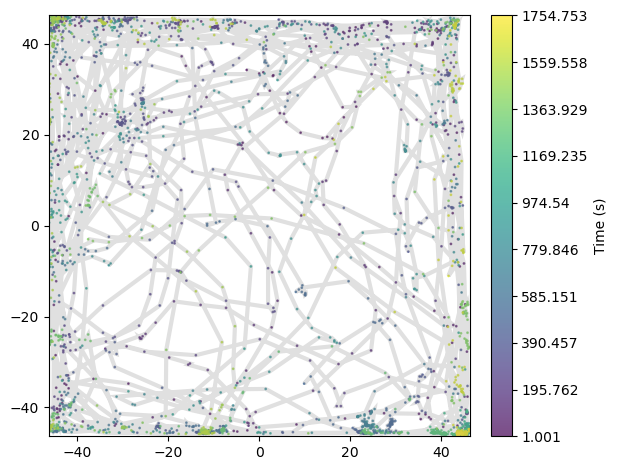

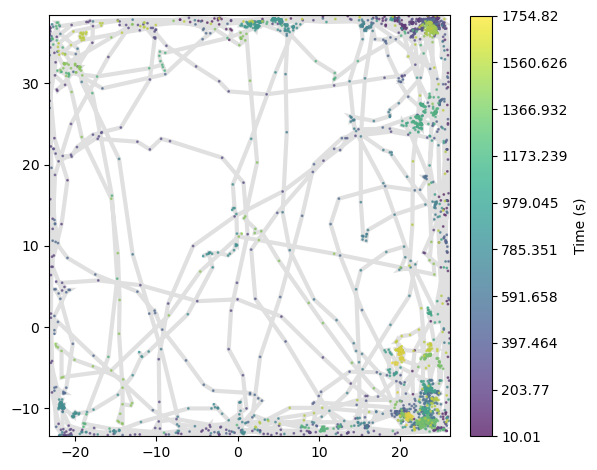

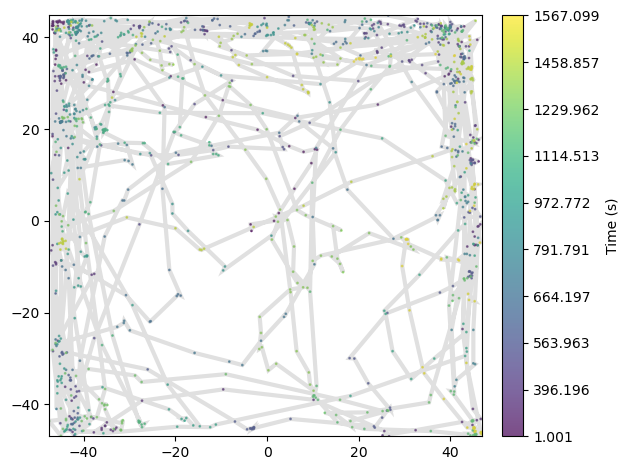

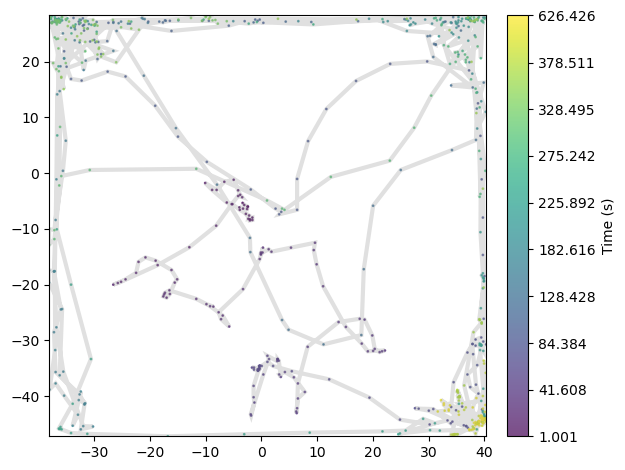

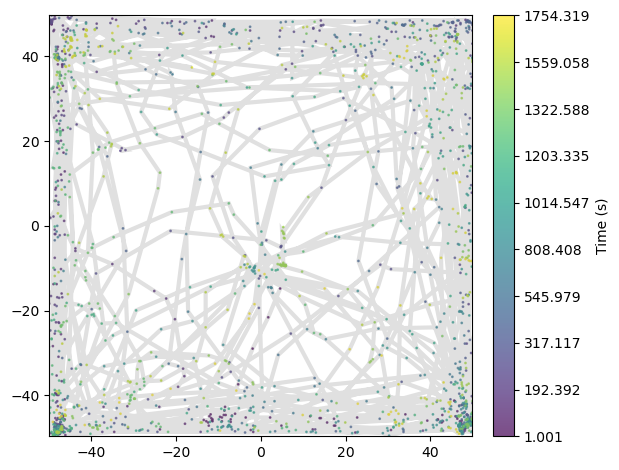

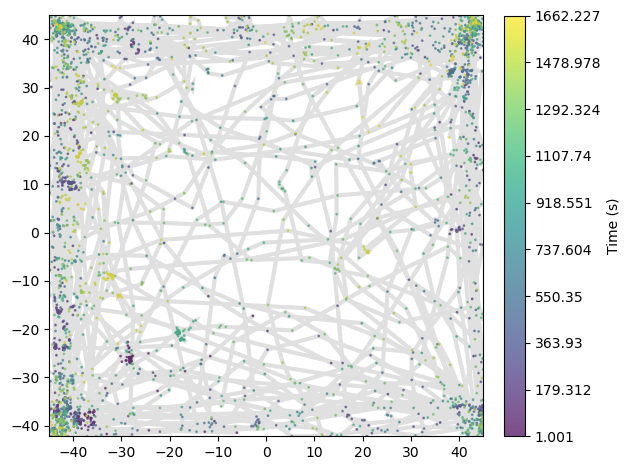

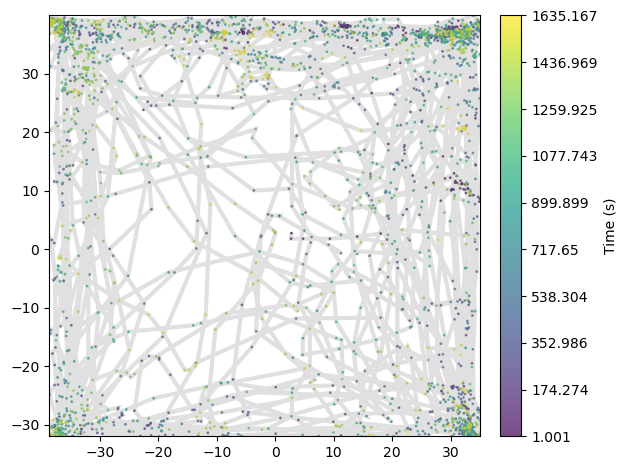

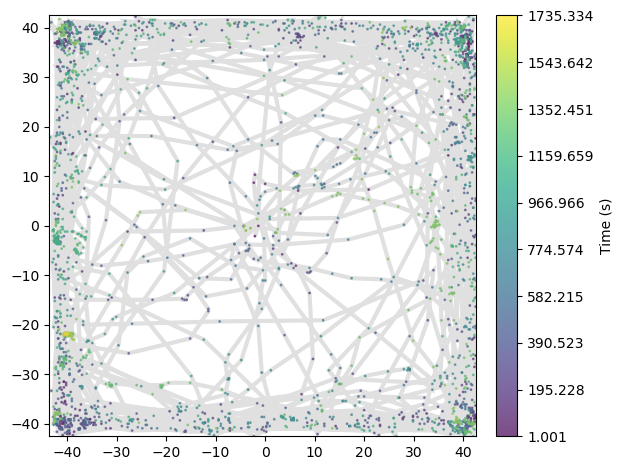

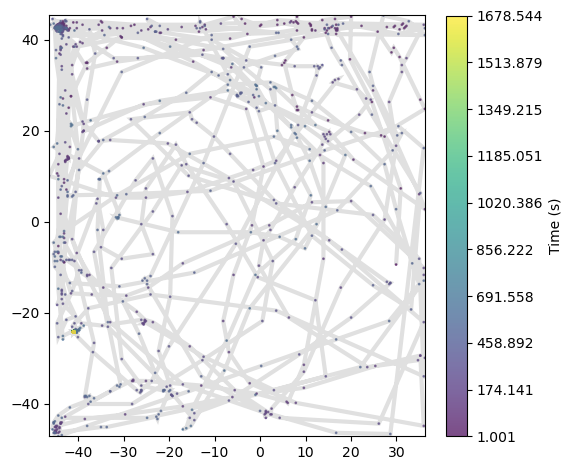

In [85]:
for i in dfs_step:
    traja.plot(dfs_step[i])

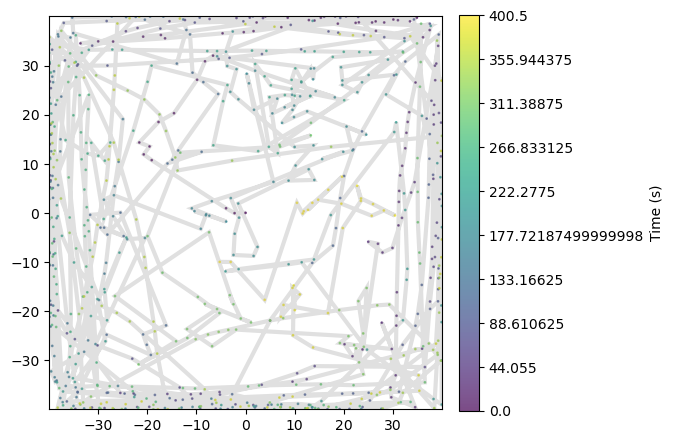

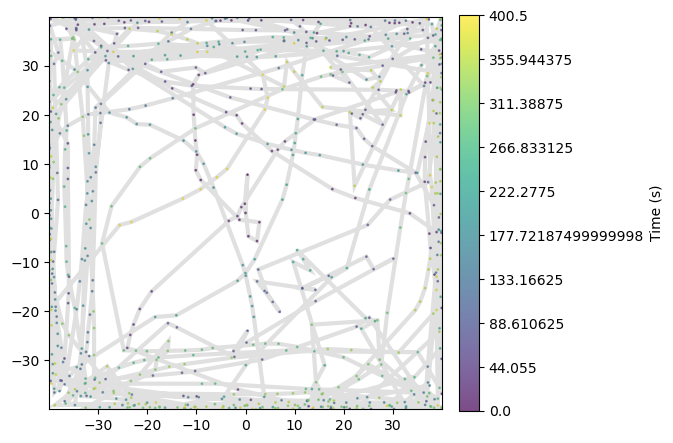

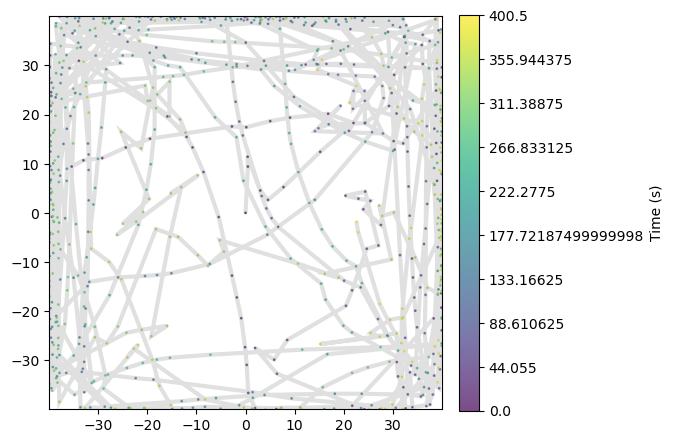

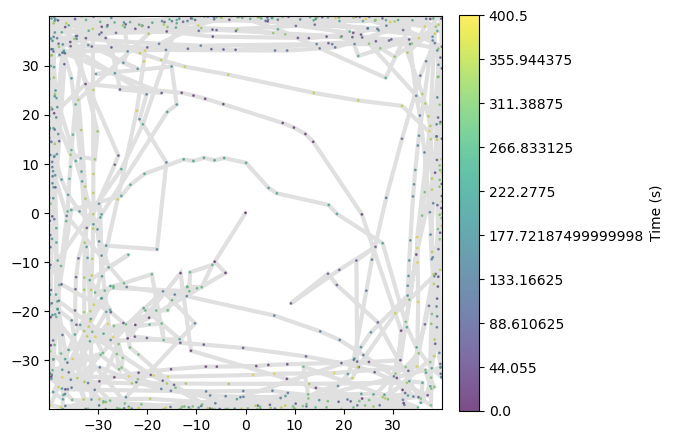

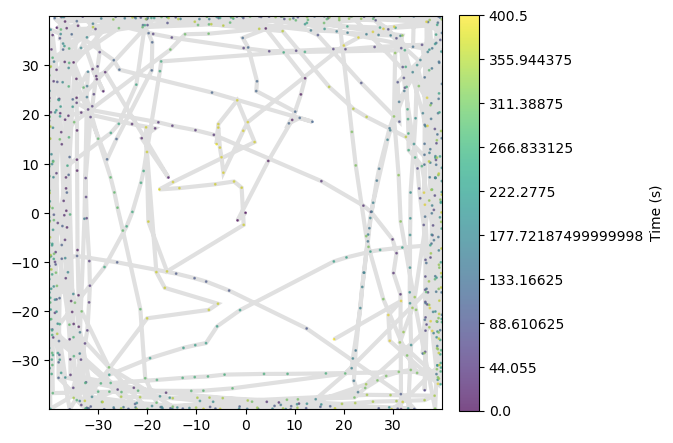

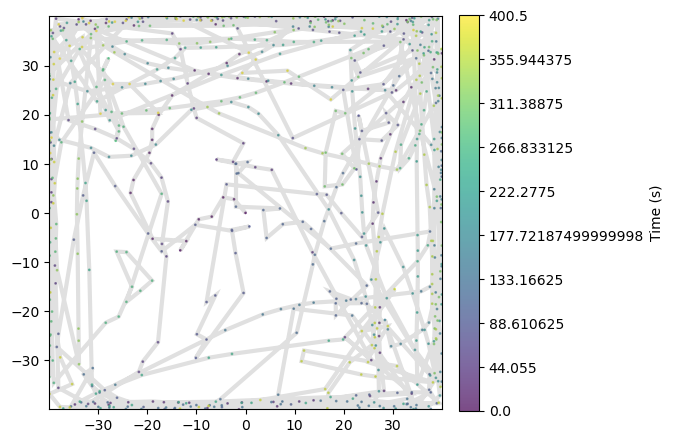

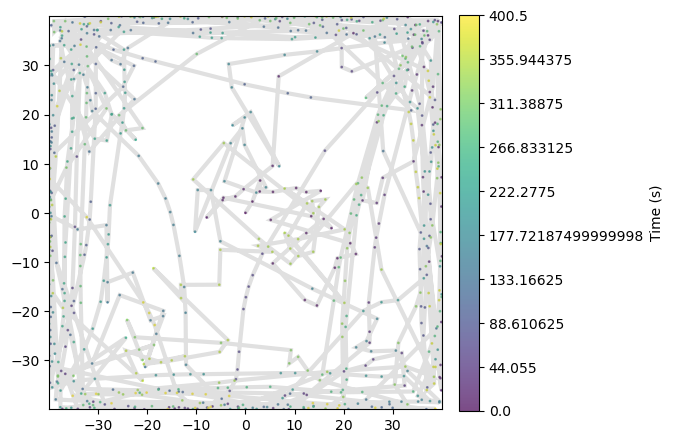

In [77]:
for i in new_stepdfs:
    traja.plot(new_stepdfs[i])

In [92]:
for i in new_stepdfs:
    new_stepdfs[i] = addFilteredV(new_stepdfs[i])

ValueError: cannot insert Vx, already exists

In [104]:
new_step = {}
for i in new_stepdfs:
    print(len(new_stepdfs[i]))
    new_step[i] = returnStepsDFdeltaAng(new_stepdfs[i], 0.499)
    print(len(new_step[i]))

801
801
801
801
801
801
801
801
801
801
801
801
801
801


In [96]:
def addNearWalls(trN, bord_trN):    
    trN['near_wall'] = 0
    ylength = bord_trN['yma'] - bord_trN['ymi'] 
    xlength = bord_trN['xma'] - bord_trN['xmi'] 
    xl = bord_trN['xmi']  + xlength * 0.1
    xr = bord_trN['xma']  - xlength * 0.1
    yd = bord_trN['ymi']  + ylength * 0.1
    yu = bord_trN['yma']  - ylength * 0.1
    
    for i in range(len(trN)):     
        if trN['x'].iloc[i] < xl:
            if trN['y'].iloc[i] > yu:
                trN['near_wall'].iloc[i] = 40
            elif trN['y'].iloc[i] < yd:
                trN['near_wall'].iloc[i] = 30
            else:
                trN['near_wall'].iloc[i] = 4
        elif trN['x'].iloc[i] > xr:
            if trN['y'].iloc[i] > yu:
                trN['near_wall'].iloc[i] = 10
            elif trN['y'].iloc[i] < yd:
                trN['near_wall'].iloc[i] = 20
            else:
                trN['near_wall'].iloc[i] = 2
        elif trN['y'].iloc[i] > yu:
            trN['near_wall'].iloc[i] = 1
        elif trN['y'].iloc[i] < yd:
            trN['near_wall'].iloc[i] = 3
    print(yd, yu)
    
    return trN

In [97]:
bord = {'xmi':-40, 'xma': 40, 'ymi':-40, 'yma':40}

In [105]:
for i in new_step:
    new_step[i] = addNearWalls(new_step[i], bord)

-32.0 32.0
-32.0 32.0
-32.0 32.0
-32.0 32.0
-32.0 32.0
-32.0 32.0
-32.0 32.0


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8016\1388506519.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 1
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8016\1388506519.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 10
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8016\1388506519.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 40
C:\Users

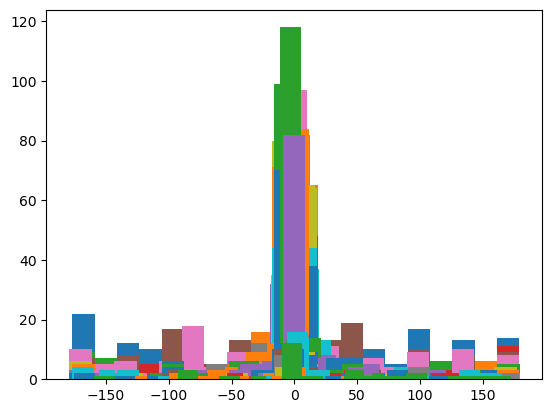

In [107]:
all_hist = {}
for numb in [0, 1, 2, 3, 4, 10, 20, 30, 40]:
    all_hist[str(numb)] = {}
    for na in new_step:
        dffor1line = new_step[na].loc[new_step[na]['near_wall'] == numb]
        y, binEdges, _ = plt.hist(dffor1line['delta_angle'], 20)
        x = 0.5 * (binEdges[1:] + binEdges[:-1])
        all_hist[str(numb)][na] = [x, y]

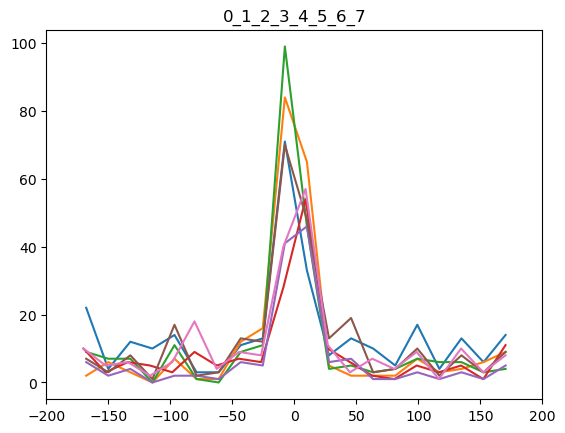

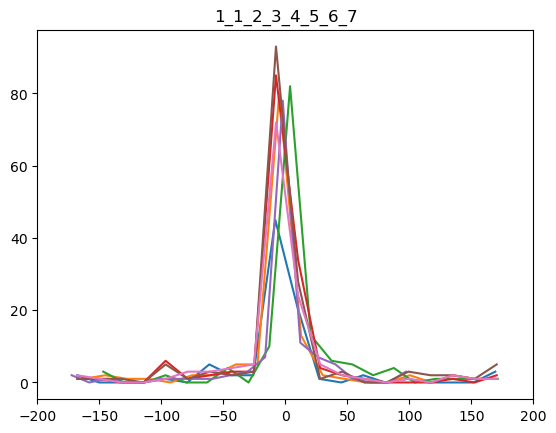

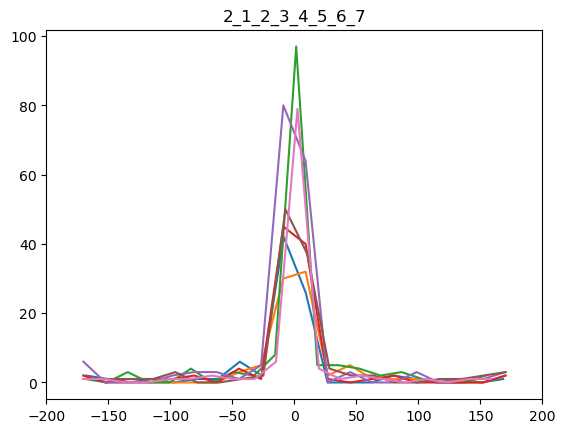

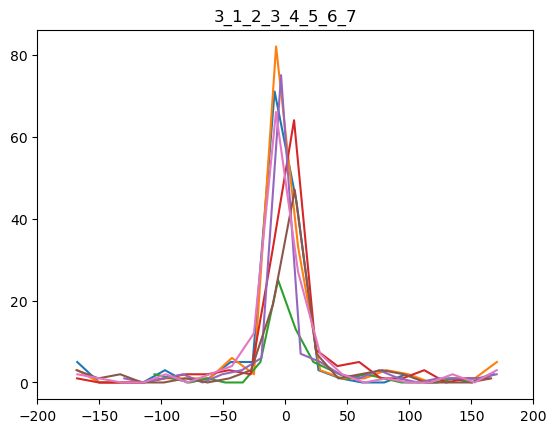

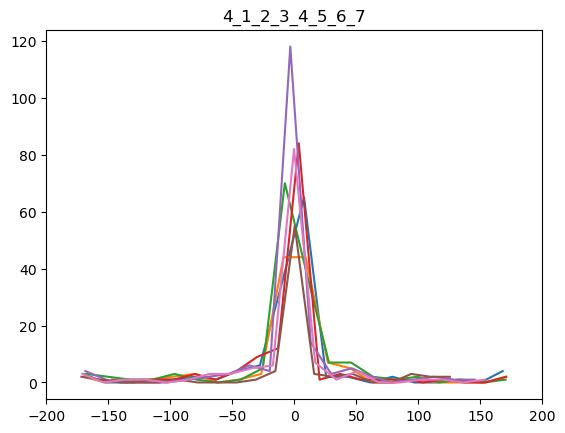

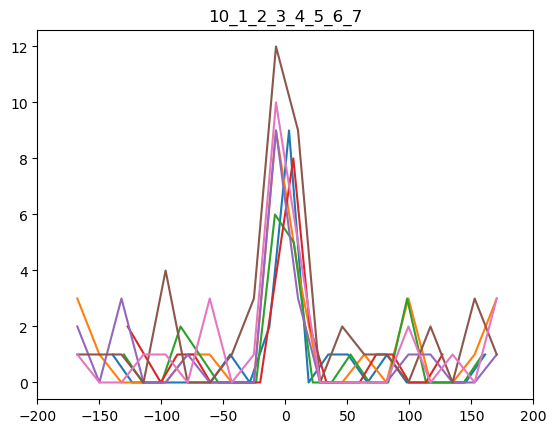

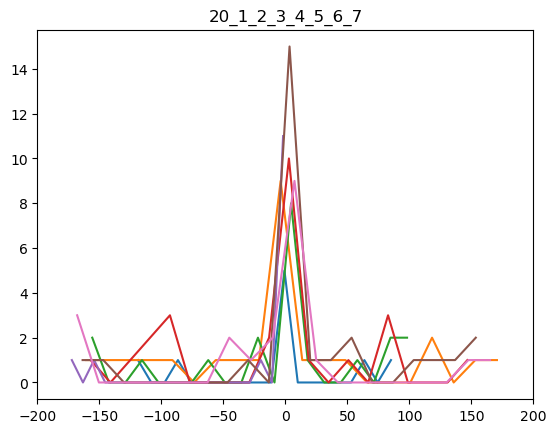

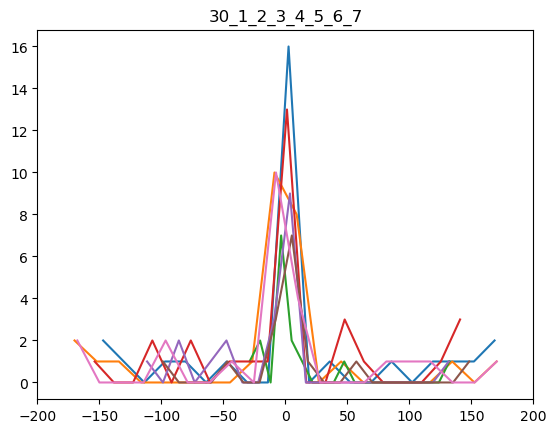

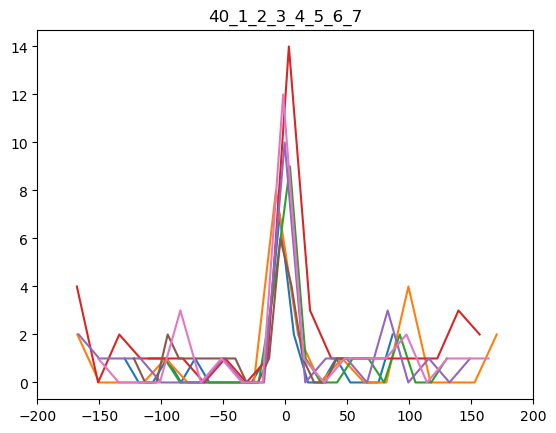

In [109]:
for i in [0, 1, 2, 3, 4, 10, 20, 30, 40]:
    plt.figure()
    ax = plt.gca()
    ax.set_xlim([-200, 200])
    #ax.set_ylim([0, 120])
    tit = str(i)
    for na in new_step:
        plt.plot(all_hist[str(i)][na][0], all_hist[str(i)][na][1])
        tit = tit + '_' + na
    plt.title(tit)
    #plt.savefig('C:\\Users\\Lenovo\\1navigation\\angles_hist\\delta_ang\\'+tit)
    plt.show()

In [129]:
for n in [0, 1, 2, 3, 4, 10, 20, 30, 40]:
    for i in new_step:
        print(i + ' ' + str(n))
        print(len(new_step[i].loc[new_step[i]['near_wall'] == n]))

1 0
286
2 0
237
3 0
242
4 0
180
5 0
143
6 0
255
7 0
221
1 1
85
2 1
121
3 1
135
4 1
146
5 1
124
6 1
155
7 1
128
1 2
87
2 2
84
3 2
140
4 2
103
5 2
175
6 2
112
7 2
104
1 3
143
2 3
146
3 3
62
4 3
131
5 3
114
6 3
93
7 3
131
1 4
129
2 4
116
3 4
146
4 4
126
5 4
168
6 4
79
7 4
120
1 10
17
2 10
27
3 10
20
4 10
22
5 10
21
6 10
42
7 10
28
1 20
9
2 20
24
3 20
20
4 20
25
5 20
14
6 20
27
7 20
20
1 30
29
2 30
26
3 30
15
4 30
29
5 30
19
6 30
15
7 30
23
1 40
16
2 40
20
3 40
21
4 40
39
5 40
23
6 40
23
7 40
26


In [131]:
def makeDictCutDfsSteps(dictN, n1, l):
    for i in new_step:
        print(i + ' ' + str(n1))
        k = new_step[i].loc[new_step[i]['near_wall'] == n1]
        print(len(k))
        if len(k > l):
            k = k.iloc[0:l]
        print(len(k))
        dictN[i] = k

In [132]:
dict10 = {}
makeDictCutDfsSteps(dict10, 10, 9000000)
dict20 = {}
makeDictCutDfsSteps(dict20, 20, 10000008)
dict30 = {}
makeDictCutDfsSteps(dict30, 30, 10700000)
dict40 = {}
makeDictCutDfsSteps(dict40, 40, 100000002)

dict0 = {}
makeDictCutDfsSteps(dict0, 0, 28999991)
dict1 = {}
makeDictCutDfsSteps(dict1, 1, 29999999999900)
dict2 = {}
makeDictCutDfsSteps(dict2, 2, 2099999999992)
dict3 = {}
makeDictCutDfsSteps(dict3, 3, 19999999999964)
dict4 = {}
makeDictCutDfsSteps(dict4, 4, 29999999909)

1 10
17
17
2 10
27
27
3 10
20
20
4 10
22
22
5 10
21
21
6 10
42
42
7 10
28
28
1 20
9
9
2 20
24
24
3 20
20
20
4 20
25
25
5 20
14
14
6 20
27
27
7 20
20
20
1 30
29
29
2 30
26
26
3 30
15
15
4 30
29
29
5 30
19
19
6 30
15
15
7 30
23
23
1 40
16
16
2 40
20
20
3 40
21
21
4 40
39
39
5 40
23
23
6 40
23
23
7 40
26
26
1 0
286
286
2 0
237
237
3 0
242
242
4 0
180
180
5 0
143
143
6 0
255
255
7 0
221
221
1 1
85
85
2 1
121
121
3 1
135
135
4 1
146
146
5 1
124
124
6 1
155
155
7 1
128
128
1 2
87
87
2 2
84
84
3 2
140
140
4 2
103
103
5 2
175
175
6 2
112
112
7 2
104
104
1 3
143
143
2 3
146
146
3 3
62
62
4 3
131
131
5 3
114
114
6 3
93
93
7 3
131
131
1 4
129
129
2 4
116
116
3 4
146
146
4 4
126
126
5 4
168
168
6 4
79
79
7 4
120
120


In [133]:
dict10

{'1':            time          x          y         Vx         Vy          V  \
 13     6.508125  34.877448  39.743886  43.893624   0.986801  43.904715   
 32    16.020000  33.484772  38.993626  10.481682   0.463732  10.491936   
 39    19.524375  36.135094  35.752039  19.135794  -2.581954  19.309197   
 40    20.025000  37.496825  37.216856   2.720062   2.925977   3.995006   
 71    35.544375  39.222995  34.000001   1.309633   8.065976   8.171604   
 157   78.598125  32.357497  35.551292  16.475622  -1.273904  16.524799   
 158   79.098750  37.521252  38.506308  10.314618   5.902654  11.884135   
 173   86.608125  34.296622  39.380297  29.975946  -0.637498  29.982724   
 209  104.630625  39.333810  36.308842   3.634772  40.493446  40.656250   
 394  197.246250  37.708685  38.070328  48.038351  -2.032112  48.081313   
 395  197.746875  32.365872  34.960791 -10.672285  -6.211312  12.348201   
 472  236.295000  32.041636  32.821403  13.273821   0.258317  13.276334   
 600  300.375000  35

In [134]:
def makeMergDf(dictN):
    listN = []
    for i in dictN:
        listN.append(dictN[i]['delta_angle'])
    dfN = pd.concat(listN)
    dfN = dfN.reset_index()
    dfN = dfN.drop(['index'], axis=1)
    return dfN

In [135]:
df10 = makeMergDf(dict10)
df20 = makeMergDf(dict20)
df30 = makeMergDf(dict30)
df40 = makeMergDf(dict40)
df0 = makeMergDf(dict0)
df1 = makeMergDf(dict1)
df2 = makeMergDf(dict2)
df3 = makeMergDf(dict3)
df4 = makeMergDf(dict4)

In [136]:
listAng = []
for i in dict10:
    listAng.append(dict10[i]['delta_angle'])
for i in dict20:
    listAng.append(dict20[i]['delta_angle'])
for i in dict30:
    listAng.append(dict30[i]['delta_angle'])
for i in dict40:
    listAng.append(dict40[i]['delta_angle'])
dfAng = pd.concat(listAng)
dfAng = dfAng.reset_index()
dfAng = dfAng.drop(['index'], axis=1)

In [138]:
listWall = []
for i in dict1:
    listWall.append(dict1[i]['delta_angle'])
for i in dict2:
    listWall.append(dict2[i]['delta_angle'])
for i in dict3:
    listWall.append(dict3[i]['delta_angle'])
for i in dict4:
    listWall.append(dict4[i]['delta_angle'])
dfWall = pd.concat(listWall)
dfWall = dfWall.reset_index()
dfWall = dfWall.drop(['index'], axis=1)

In [139]:
mergDfs = {'10':df10, '20':df20, '30':df30, '40':df40, '0':df0, '1':df1, '2':df2, '3':df3, '4':df4, 'corn': dfAng, 'wall':dfWall}

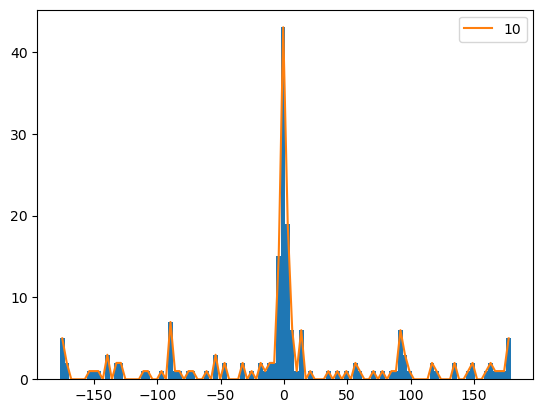

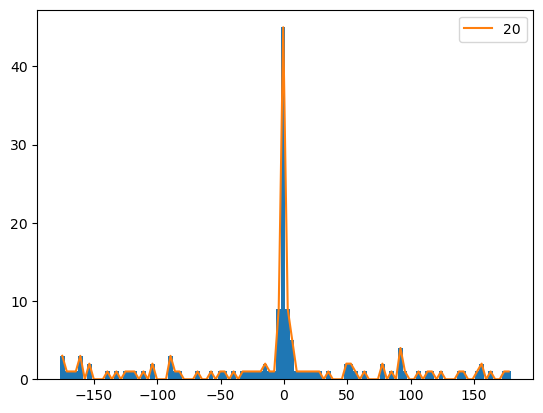

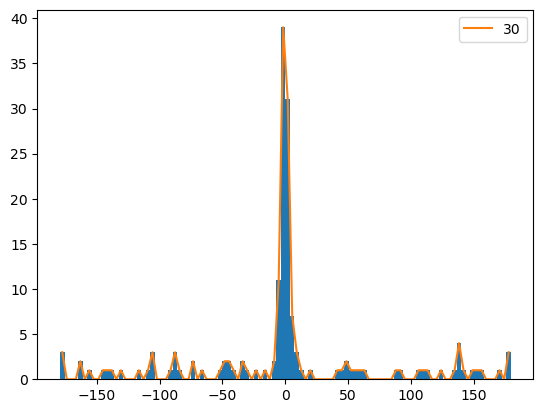

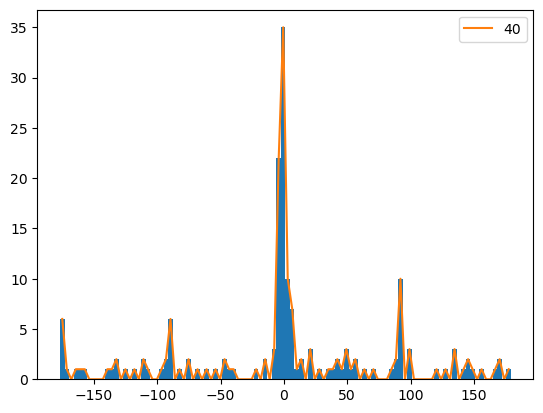

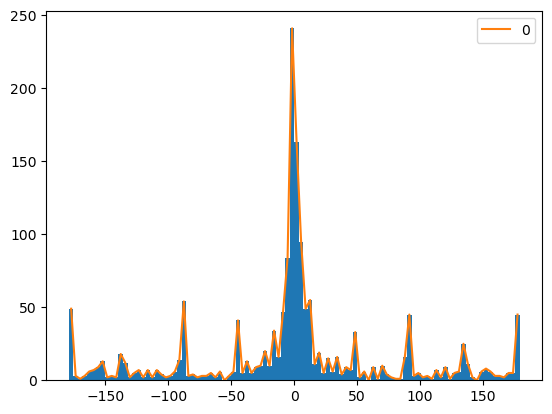

...

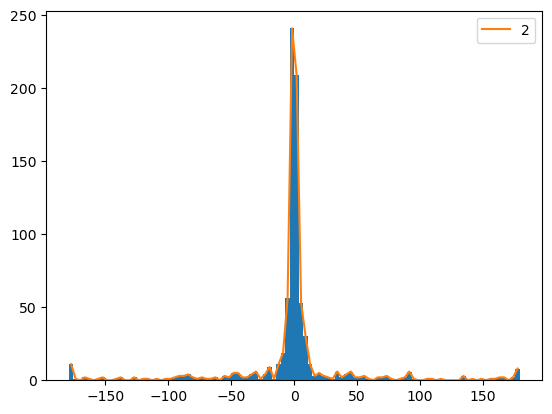

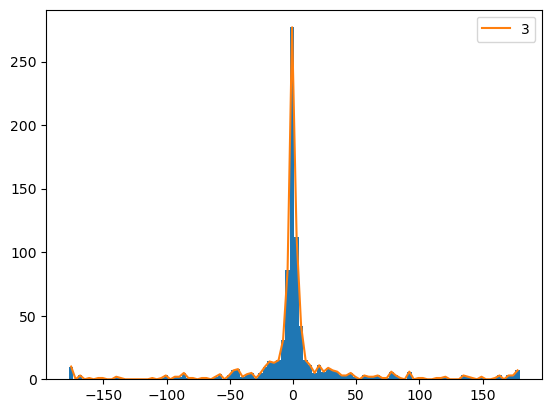

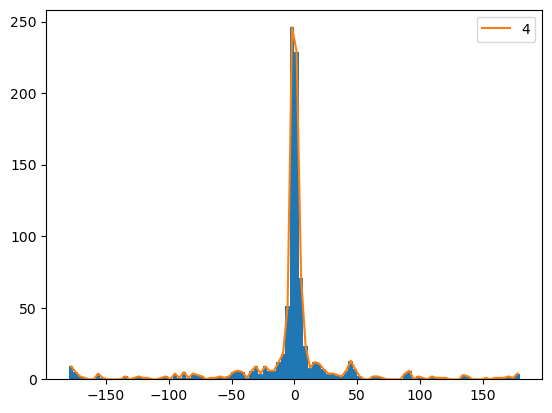

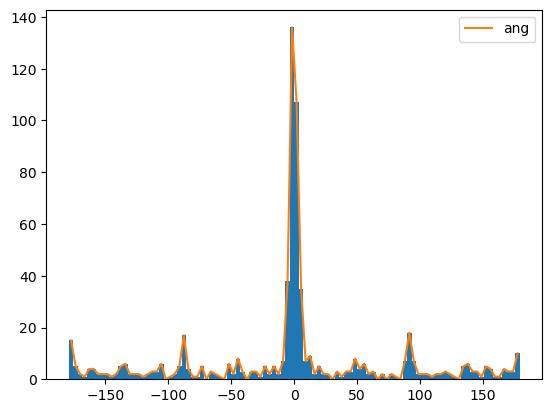

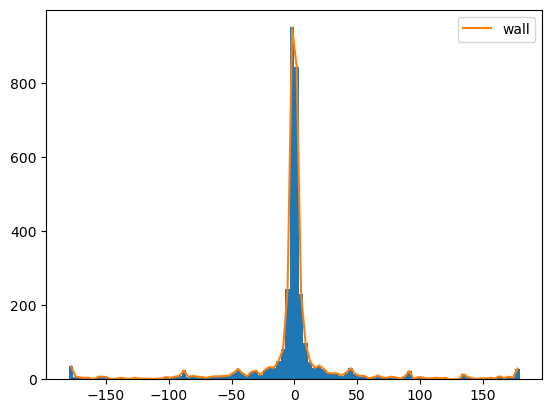

In [140]:
mergPlots = {}
for i in mergDfs:
    y, binEdges, _ = plt.hist(mergDfs[i], 100)
    x = 0.5 * (binEdges[1:] + binEdges[:-1])
    mergPlots[i]  = [x, y]
    plt.plot(x, y, label=i)
    plt.legend()
    plt.show()

## сделаем гистограммы распределения углов для реальных значений

In [112]:
def addNearWalls(trN, bord_trN):    
    trN['near_wall'] = 0
    ylength = bord_trN['yma'] - bord_trN['ymi'] 
    xlength = bord_trN['xma'] - bord_trN['xmi'] 
    xl = bord_trN['xmi']  + xlength * 0.1
    xr = bord_trN['xma']  - xlength * 0.1
    yd = bord_trN['ymi']  + ylength * 0.1
    yu = bord_trN['yma']  - ylength * 0.1
    
    for i in range(len(trN)):     
        if trN['x'].iloc[i] < xl:
            if trN['y'].iloc[i] > yu:
                trN['near_wall'].iloc[i] = 40
            elif trN['y'].iloc[i] < yd:
                trN['near_wall'].iloc[i] = 30
            else:
                trN['near_wall'].iloc[i] = 4
        elif trN['x'].iloc[i] > xr:
            if trN['y'].iloc[i] > yu:
                trN['near_wall'].iloc[i] = 10
            elif trN['y'].iloc[i] < yd:
                trN['near_wall'].iloc[i] = 20
            else:
                trN['near_wall'].iloc[i] = 2
        elif trN['y'].iloc[i] > yu:
            trN['near_wall'].iloc[i] = 1
        elif trN['y'].iloc[i] < yd:
            trN['near_wall'].iloc[i] = 3
    print(yd, yu)
    
    return trN

{'tr1':           time       x       y         Vx         Vy          V     angles  \
 0        1.001  -2.733  34.229   0.000000   0.000000   0.000000        NaN   
 1        1.502   0.000  33.448  45.941176 -11.500000  47.358650 -14.053504   
 2        2.035   2.993  32.928   0.000000   3.939394   3.939394  90.000000   
 3        2.536   3.124  33.058   0.000000   0.000000   0.000000        NaN   
 4        3.036   0.911  33.709   3.939394   0.000000   3.939394   0.000000   
 ...        ...     ...     ...        ...        ...        ...        ...   
 3498  1752.751  43.860 -45.943   3.939394   0.000000   3.939394   0.000000   
 3499  1753.252  43.860 -45.943   0.000000   0.000000   0.000000        NaN   
 3500  1753.752  43.860 -45.943   0.000000   0.000000   0.000000        NaN   
 3501  1754.253  43.860 -45.813   0.000000   3.823529   3.823529  90.000000   
 3502  1754.753  43.860 -45.943   0.000000   0.000000   0.000000        NaN   
 
       delta_angle  
 0        0.000000  
 

In [113]:
for i in dfs_step:
    bord_tr = {'xmi':dfs_step[i]['x'].min(), 'xma': dfs_step[i]['x'].max(), 'ymi':dfs_step[i]['y'].min(), 'yma':dfs_step[i]['y'].max()}
    dfs_step[i] = addNearWalls(dfs_step[i], bord_tr)

C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8016\1388506519.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 1
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8016\1388506519.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 10
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8016\1388506519.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 2
C:\Users\

-37.0794 36.949400000000004


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8016\1388506519.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 1
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8016\1388506519.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 10
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8016\1388506519.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 2
C:\Users\

-8.2409 33.1839
-37.7954 35.617399999999996
-39.637699999999995 20.7487


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8016\1388506519.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 10
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8016\1388506519.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 2
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8016\1388506519.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 3
C:\Users\

-39.693599999999996 39.693599999999996
-33.4707 36.219699999999996


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8016\1388506519.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 2
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8016\1388506519.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 1
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8016\1388506519.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 10
C:\Users\

-24.753 32.775


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8016\1388506519.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 2
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8016\1388506519.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 10
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8016\1388506519.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 20
C:\Users

-33.9952 33.9952
-37.9063 36.1313


C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8016\1388506519.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 2
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8016\1388506519.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 1
C:\Users\Lenovo\AppData\Local\Temp\ipykernel_8016\1388506519.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trN['near_wall'].iloc[i] = 10
C:\Users\

C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\matplotlib\axes\_axes.py:6731: RuntimeWarning: All-NaN slice encountered
  xmin = min(xmin, np.nanmin(xi))
C:\Users\Lenovo\anaconda3\envs\navigation\lib\site-packages\matplotlib\axes\_axes.py:6732: RuntimeWarning: All-NaN slice encountered
  xmax = max(xmax, np.nanmax(xi))


ValueError: autodetected range of [nan, nan] is not finite

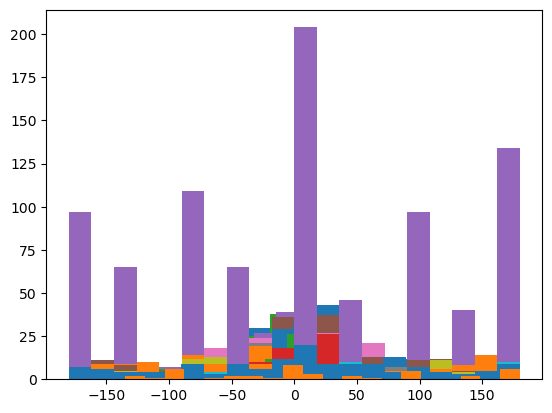

In [114]:
all_hist_real = {}
for numb in [0, 1, 2, 3, 4, 10, 20, 30, 40]:
    all_hist_real[str(numb)] = {}
    for na in dfs_step:
        dffor1line = dfs_step[na].loc[dfs_step[na]['near_wall'] == numb]
        y, binEdges, _ = plt.hist(dffor1line['delta_angle'], 20)
        x = 0.5 * (binEdges[1:] + binEdges[:-1])
        all_hist_real[str(numb)][na] = [x, y]

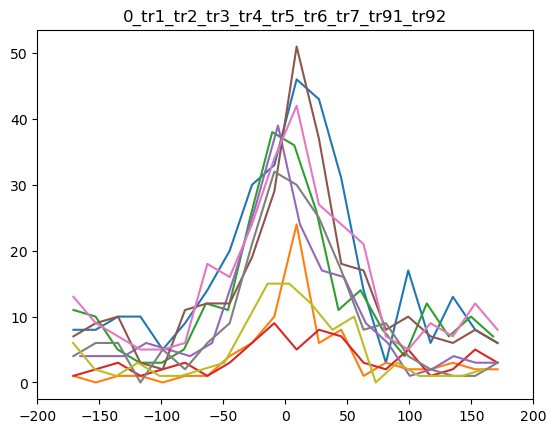

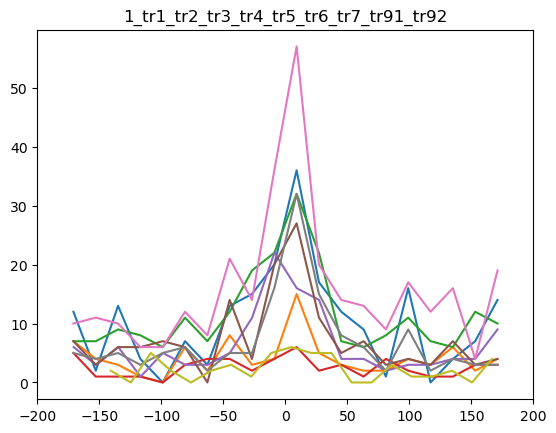

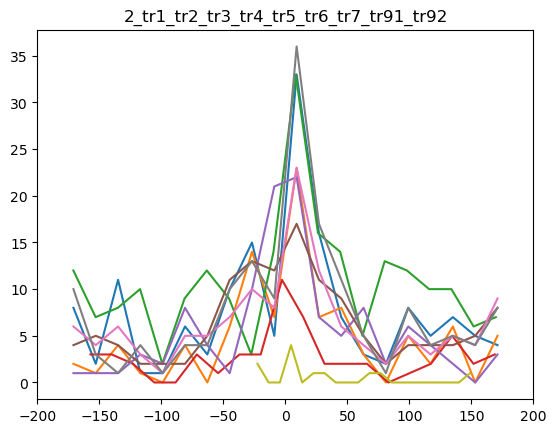

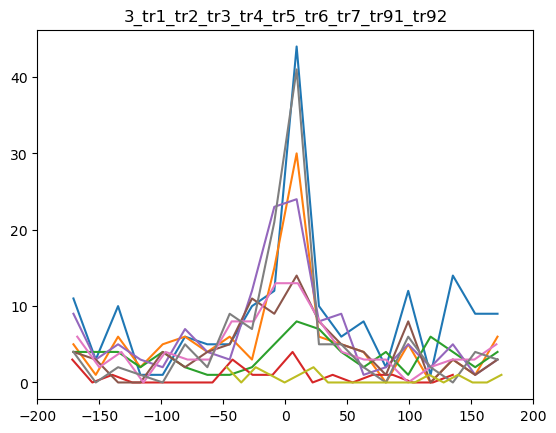

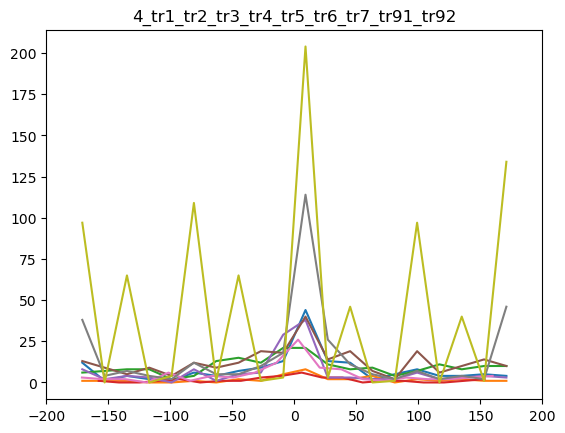

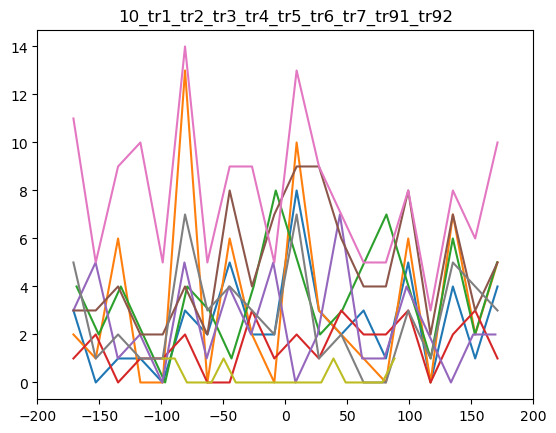

KeyError: 'tr92'

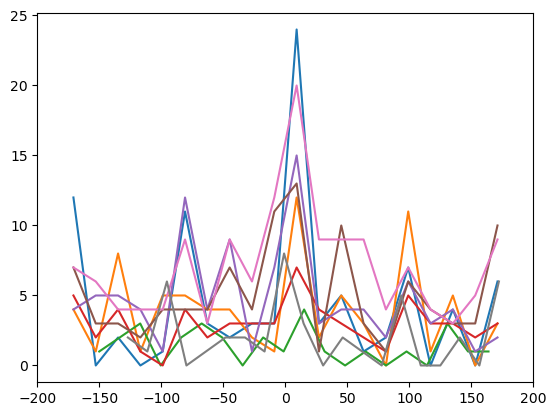

In [115]:
for i in [0, 1, 2, 3, 4, 10, 20, 30, 40]:
    plt.figure()
    ax = plt.gca()
    ax.set_xlim([-200, 200])
    #ax.set_ylim([0, 120])
    tit = str(i)
    for na in dfs_step:
        plt.plot(all_hist_real[str(i)][na][0], all_hist_real[str(i)][na][1])
        tit = tit + '_' + na
    plt.title(tit)
    #plt.savefig('C:\\Users\\Lenovo\\1navigation\\angles_hist\\delta_ang\\'+tit)
    plt.show()

In [142]:
dfs_step

{'tr1':           time       x       y         Vx         Vy          V     angles  \
 0        1.001  -2.733  34.229   0.000000   0.000000   0.000000        NaN   
 1        1.502   0.000  33.448  45.941176 -11.500000  47.358650 -14.053504   
 2        2.035   2.993  32.928   0.000000   3.939394   3.939394  90.000000   
 3        2.536   3.124  33.058   0.000000   0.000000   0.000000        NaN   
 4        3.036   0.911  33.709   3.939394   0.000000   3.939394   0.000000   
 ...        ...     ...     ...        ...        ...        ...        ...   
 3498  1752.751  43.860 -45.943   3.939394   0.000000   3.939394   0.000000   
 3499  1753.252  43.860 -45.943   0.000000   0.000000   0.000000        NaN   
 3500  1753.752  43.860 -45.943   0.000000   0.000000   0.000000        NaN   
 3501  1754.253  43.860 -45.813   0.000000   3.823529   3.823529  90.000000   
 3502  1754.753  43.860 -45.943   0.000000   0.000000   0.000000        NaN   
 
       delta_angle  near_wall  
 0        0

In [147]:
%matplotlib
kkdf = dfs_step['tr1'].loc[(dfs_step['tr1']['near_wall']>=1) & (dfs_step['tr1']['near_wall']<=4)]
plt.plot(kkdf['time'], kkdf['angles'])

Using matplotlib backend: Qt5Agg
